In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys,re,glob, subprocess, collections
import scipy
from scipy.cluster.hierarchy import *

In [2]:
datafs = []
bad = []
for fname in glob.glob('DUDE/*/result_*.txt'):
    try:
        df = pd.read_csv(fname,header=None,
                         delim_whitespace=True,usecols=[0,1,3,5,7],
                         names=('json','nconfs','F1','Recall','Precision'))
        targ,rms,nconfs = re.search(r'DUDE/(\S+)/result_(\S+)_(\d+)\.txt',fname).groups()
        if 'filtered' in rms:
            rms = float(rms.split('_')[1])
        else:
            rms = 0
        df['RMS'] = rms
        df['Target'] = targ
        
        aconfs, amols = map(int,re.findall(r': (\d+)',open(f'DUDE/{targ}/actives_final_rdkit_250_{f"filtered_{rms}" if rms > 0 else "unranked"}.cnt').read()))
        dconfs, dmols = map(int,re.findall(r': (\d+)',open(f'DUDE/{targ}/decoys_final_rdkit_250_{f"filtered_{rms}" if rms > 0 else "unranked"}.cnt').read()))
        df['aconfs'] = aconfs
        df['amols'] = amols
        df['dconfs'] = dconfs
        df['dmols'] = dmols
        df['actualconfs'] = aconfs+dconfs
        df['nmols'] = amols+dmols
        df['aveconfs'] = (aconfs+dconfs)/(amols+dmols)
        datafs.append(df)    
    except:
        print(fname)
        bad.append(fname)
    
D = pd.concat(datafs)    

In [3]:
badtargets = set(map(lambda s: re.findall(r'DUDE/(\S+)/result',s)[0],bad))
print(badtargets)
len(bad)

set()


0

In [4]:
D = D[~D.Target.isin(badtargets)]

In [5]:
D = D.reset_index(drop=True)

In [6]:
best = D.sort_values('F1').drop_duplicates(['Target','RMS','nconfs'],keep='last').\
    sort_values(['Target','RMS','nconfs']).reset_index(drop=True)

In [7]:
best.loc[best.RMS == 0.0,'RMS'] = 'Unbiased'
best['RMS'] = best['RMS'].astype('category')

In [8]:
best

,json,nconfs,F1,Recall,Precision,RMS,Target,aconfs,amols,dconfs,dmols,actualconfs,nmols,aveconfs
0,pharmit_3_2.json,1,0.456539,0.582988,0.375167,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625
1,pharmit_3_2.json,5,0.368932,0.630705,0.260720,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625
2,pharmit_3_2.json,10,0.327292,0.636929,0.220230,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625
3,pharmit_3_2.json,25,0.272292,0.649378,0.172262,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625
4,pharmit_3_2.json,50,0.234340,0.659751,0.142473,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3565,pharmit_4_11.json,10,0.382022,0.340000,0.435897,2,xiap,1466,100,43417,5145,44883,5245,8.557293
3566,pharmit_4_11.json,25,0.383420,0.370000,0.397849,2,xiap,1466,100,43417,5145,44883,5245,8.557293
3567,pharmit_4_11.json,50,0.389744,0.380000,0.400000,2,xiap,1466,100,43417,5145,44883,5245,8.557293
3568,pharmit_4_11.json,100,0.389744,0.380000,0.400000,2,xiap,1466,100,43417,5145,44883,5245,8.557293


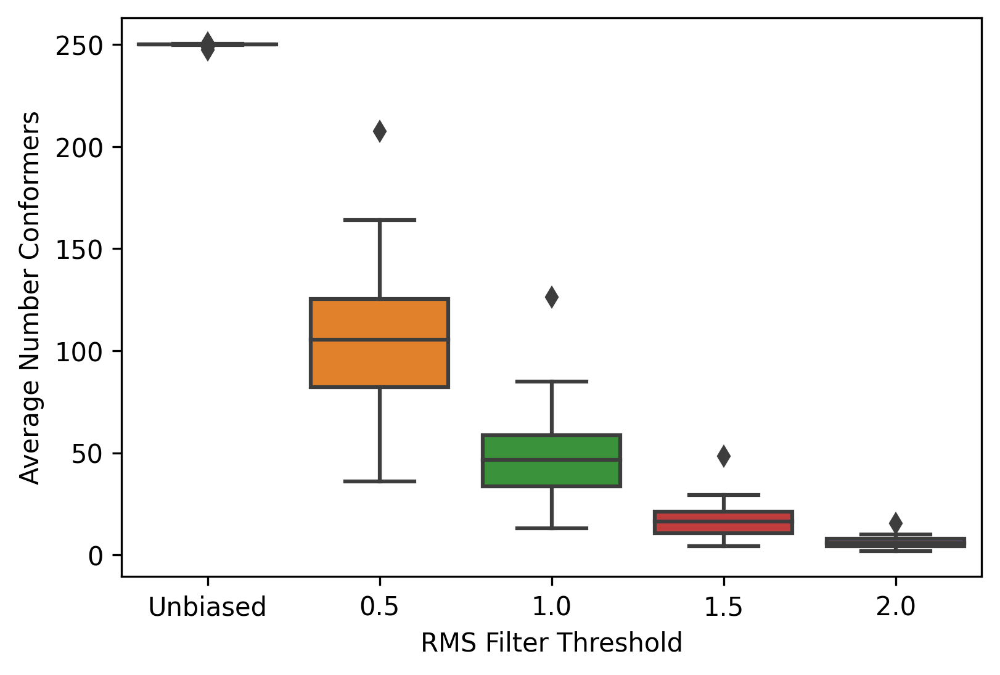

In [94]:
plt.figure(figsize=(6,4),dpi=300)
sns.boxplot(best[best.nconfs==200],y='aveconfs',x='RMS',order=['Unbiased',0.5,1.0,1.5,2.0])
plt.ylabel("Average Number Conformers")
plt.xlabel("RMS Filter Threshold")
plt.savefig('aveconfs.pdf',bbox_inches='tight')

In [92]:
best[(best.nconfs==200)].groupby('RMS').mean()

,nconfs,F1,Recall,Precision,aconfs,amols,dconfs,dmols,actualconfs,nmols,aveconfs,ΔF1
RMS,,,,,,,,,,,,
0.5,200.0,0.322163,0.403399,0.378530,27996.509804,223.578431,1.482056e+06,13735.049020,1.510052e+06,13958.627451,102.723744,0.067131
1.0,200.0,0.319696,0.390439,0.388422,14685.264706,223.578431,6.879103e+05,13735.500000,7.025956e+05,13959.078431,47.117762,0.064664
1.5,200.0,0.305421,0.360220,0.369545,5693.500000,223.578431,2.426642e+05,13734.696078,2.483577e+05,13958.274510,16.545052,0.050390
2.0,200.0,0.294483,0.341816,0.357769,1973.960784,223.578431,8.821805e+04,13727.529412,9.019201e+04,13951.107843,6.045775,0.039451
Unbiased,200.0,0.322376,0.405248,0.385256,55880.078431,223.578431,3.436682e+06,13739.205882,3.492562e+06,13962.784314,250.090394,0.067344


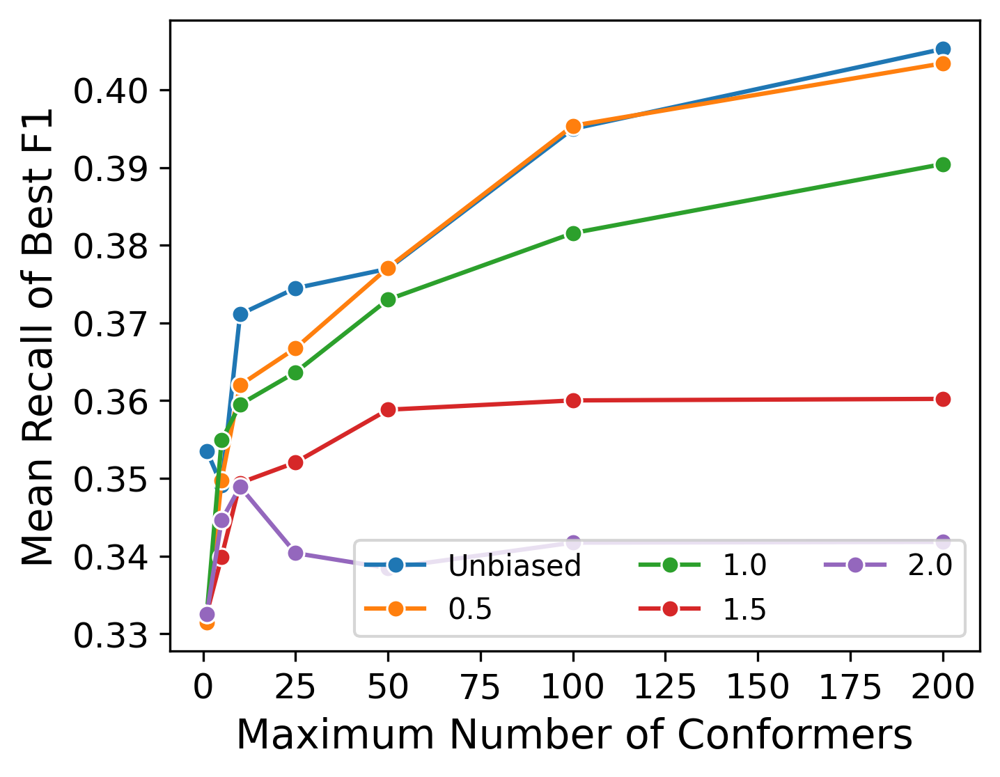

In [35]:
plt.figure(figsize=(5,4),dpi=300)
for r in best.RMS.unique():
    sns.lineplot(data=best[(best.RMS==r)],x='nconfs',y='Recall',label=r,errorbar=None,marker='o')

plt.legend(loc='lower right',ncol = 3)
plt.xlabel('Maximum Number of Conformers',fontsize=14)
plt.ylabel('Mean Recall of Best F1',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.savefig('pharm_ave.pdf',bbox_inches='tight')

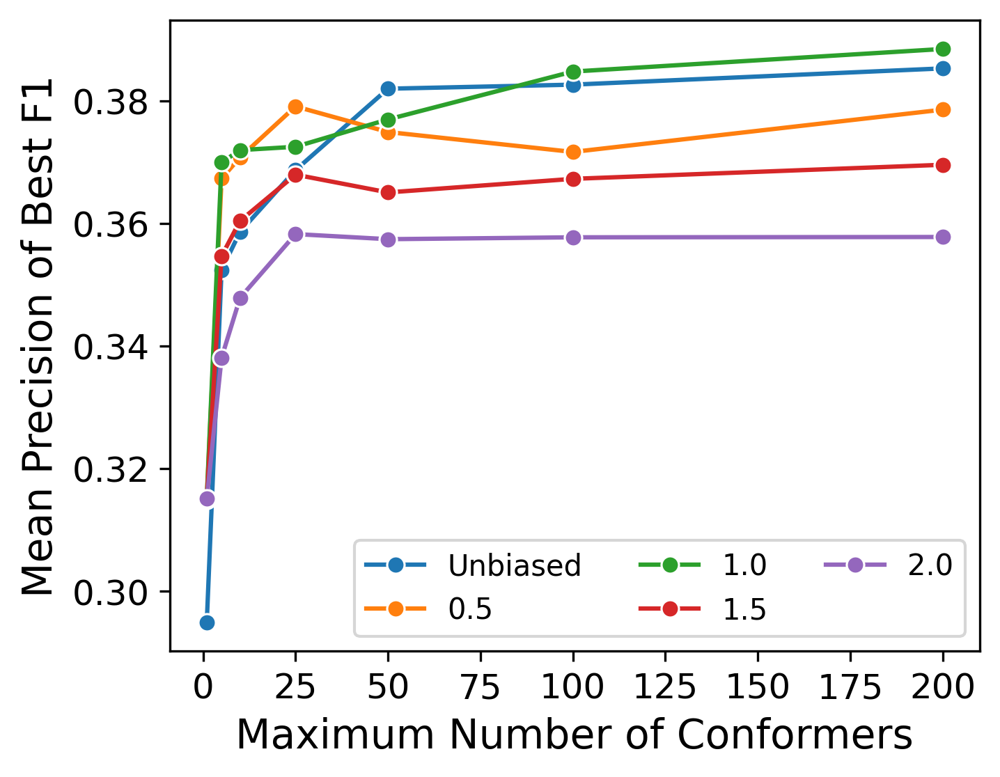

In [34]:
plt.figure(figsize=(5,4),dpi=300)
for r in best.RMS.unique():
    sns.lineplot(data=best[(best.RMS==r)],x='nconfs',y='Precision',label=r,errorbar=None,marker='o')

plt.legend(loc='lower right',ncol = 3)
plt.xlabel('Maximum Number of Conformers',fontsize=14)
plt.ylabel('Mean Precision of Best F1',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.savefig('pharm_ave.pdf',bbox_inches='tight')

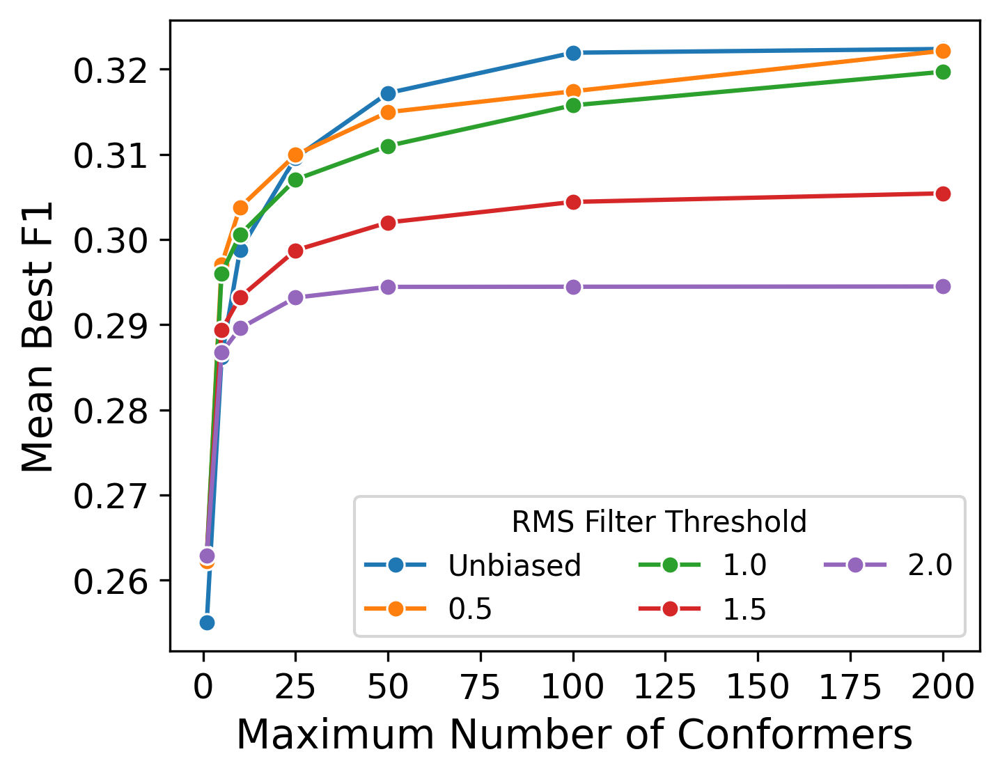

In [84]:
plt.figure(figsize=(5,4),dpi=300)
for r in best.RMS.unique():
    sns.lineplot(data=best[(best.RMS==r)],x='nconfs',y='F1',label=r,errorbar=None,marker='o')

plt.legend(loc='lower right',ncol = 3,title='RMS Filter Threshold')
plt.xlabel('Maximum Number of Conformers',fontsize=14)
plt.ylabel('Mean Best F1',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.ylim(0,1)
plt.savefig('pharm_ave.pdf',bbox_inches='tight')

In [11]:
for r,row in best.iterrows():
    ref = best[(best.Target == row.Target) & (best.nconfs == 1) & (best.RMS=='Unbiased')].F1.item()
    best.loc[r,'ΔF1'] = row.F1-ref

In [12]:
tmp = best[best.RMS == 0.5].copy()
tmp.loc[tmp.nconfs == 100,'diff'] = np.array(tmp[tmp.nconfs == 200].F1) - np.array(tmp[tmp.nconfs == 100].F1 )


In [13]:
tmp[tmp.nconfs == 100].sort_values(by='diff').mean()

nconfs         1.000000e+02
F1             3.174057e-01
Recall         3.953703e-01
Precision      3.716346e-01
aconfs         2.799651e+04
amols          2.235784e+02
dconfs         1.482056e+06
dmols          1.373505e+04
actualconfs    1.510052e+06
nmols          1.395863e+04
aveconfs       1.027237e+02
ΔF1            6.237390e-02
diff           4.756765e-03
dtype: float64

In [14]:
tmp[tmp.nconfs == 100].sort_values(by='diff')

,json,nconfs,F1,Recall,Precision,RMS,Target,aconfs,amols,dconfs,dmols,actualconfs,nmols,aveconfs,ΔF1,diff
2147,pharmit_4_31.json,100,0.308540,0.327485,0.291667,0.5,lkha4,24407,171,1027854,9445,1052261,9616,109.428141,0.212859,-0.046531
992,pharmit_6_197.json,100,0.429967,0.285714,0.868421,0.5,dyr,22309,231,1698434,17165,1720743,17396,98.916015,-0.138723,-0.036903
2602,pharmit_5_29.json,100,0.254130,0.251256,0.257069,0.5,pde5a,35118,398,3360225,27513,3395343,27911,121.648920,-0.062207,-0.026195
2952,pharmit_4_422.json,100,0.891089,0.900000,0.882353,0.5,pur2,12004,50,369400,2694,381404,2744,138.995627,0.198781,-0.025704
12,pharmit_3_2.json,100,0.202219,0.680498,0.118755,0.5,aa2ar,43094,482,3234473,31492,3277567,31974,102.507256,-0.254320,-0.023724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
537,pharmit_5_67.json,100,0.401869,0.282895,0.693548,0.5,braf,13866,152,1108538,9943,1122404,10095,111.184151,0.053610,0.044832
1342,pharmit_4_10.json,100,0.047162,0.045608,0.048825,0.5,fnta,105085,592,6470906,51411,6575991,52003,126.454070,0.008247,0.045524
1972,pharmit_5_17.json,100,0.187793,0.172414,0.206186,0.5,kif11,11213,116,607140,6849,618353,6965,88.780043,-0.020738,0.059016
3057,pharmit_4_136.json,100,0.095238,0.067308,0.162791,0.5,reni,24502,104,1440153,6955,1464655,7059,207.487604,0.007132,0.073437


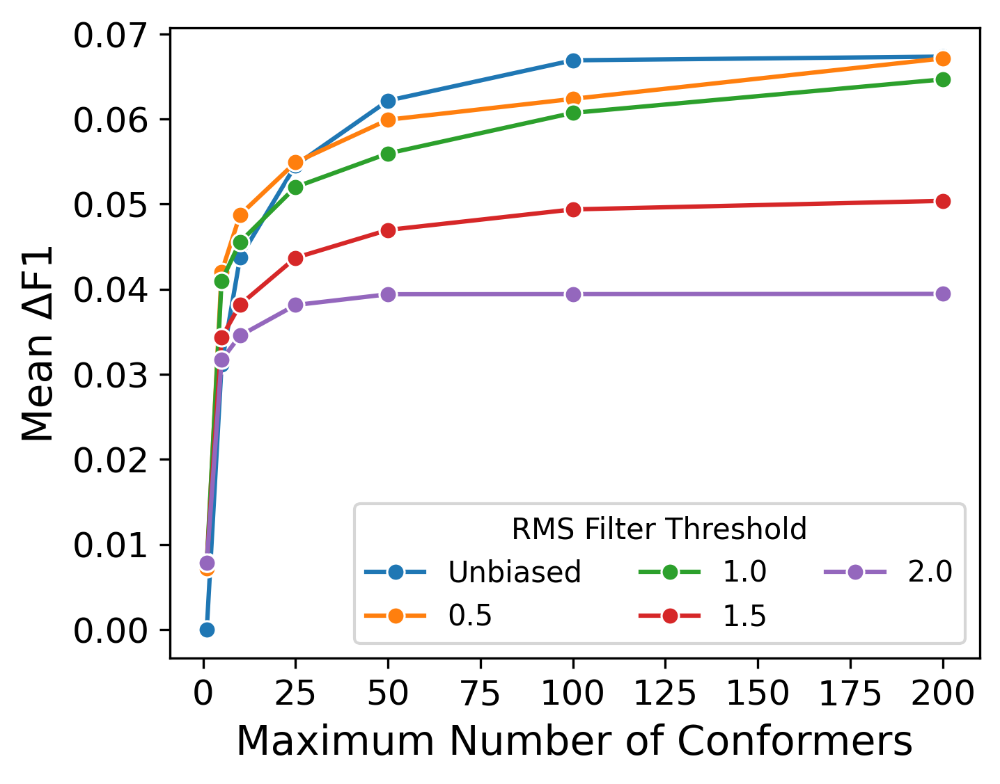

In [81]:
plt.figure(figsize=(5,4),dpi=300)
for r in best.RMS.unique():
    sns.lineplot(data=best[(best.RMS==r)],x='nconfs',y='ΔF1',label=r,marker='o',errorbar=None)

plt.legend(loc='lower right',ncol = 3,title='RMS Filter Threshold')
plt.xlabel('Maximum Number of Conformers',fontsize=14)
plt.ylabel('Mean ΔF1',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('pharm_ave_delta.pdf',bbox_inches='tight')

/opt/anaconda3-cluster/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


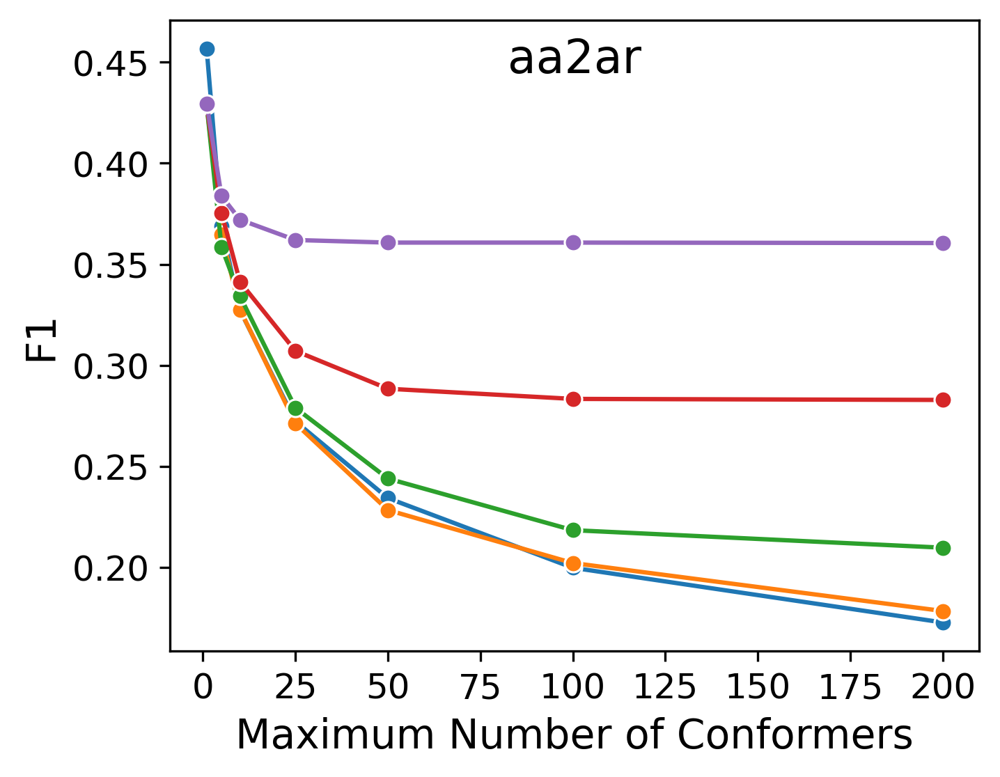

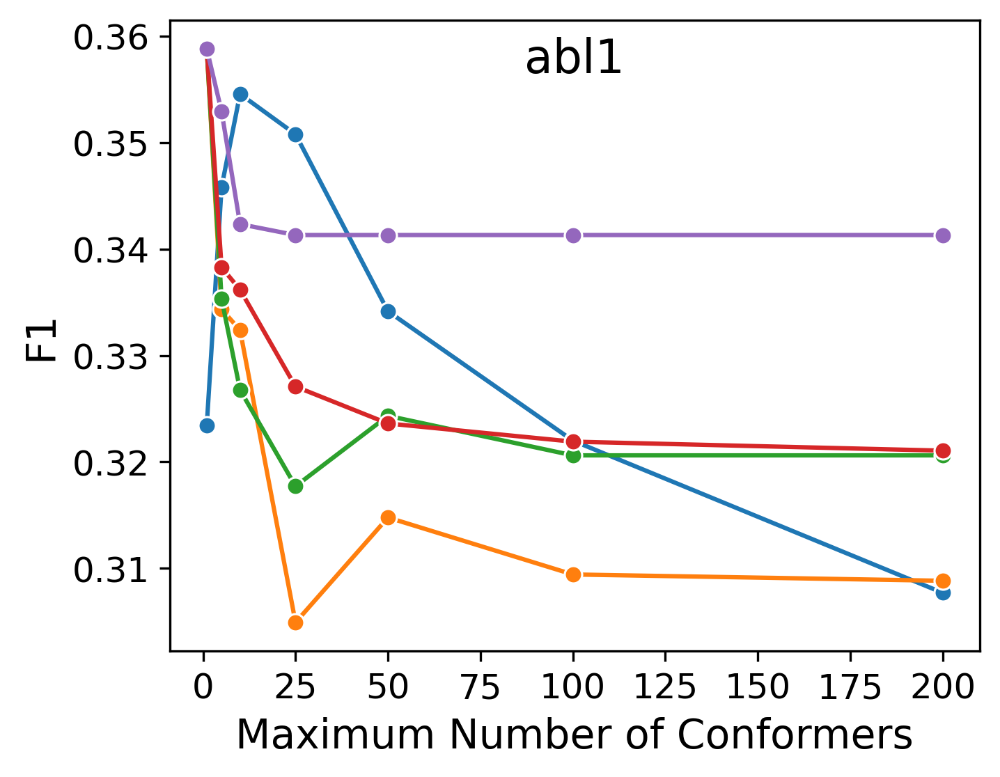

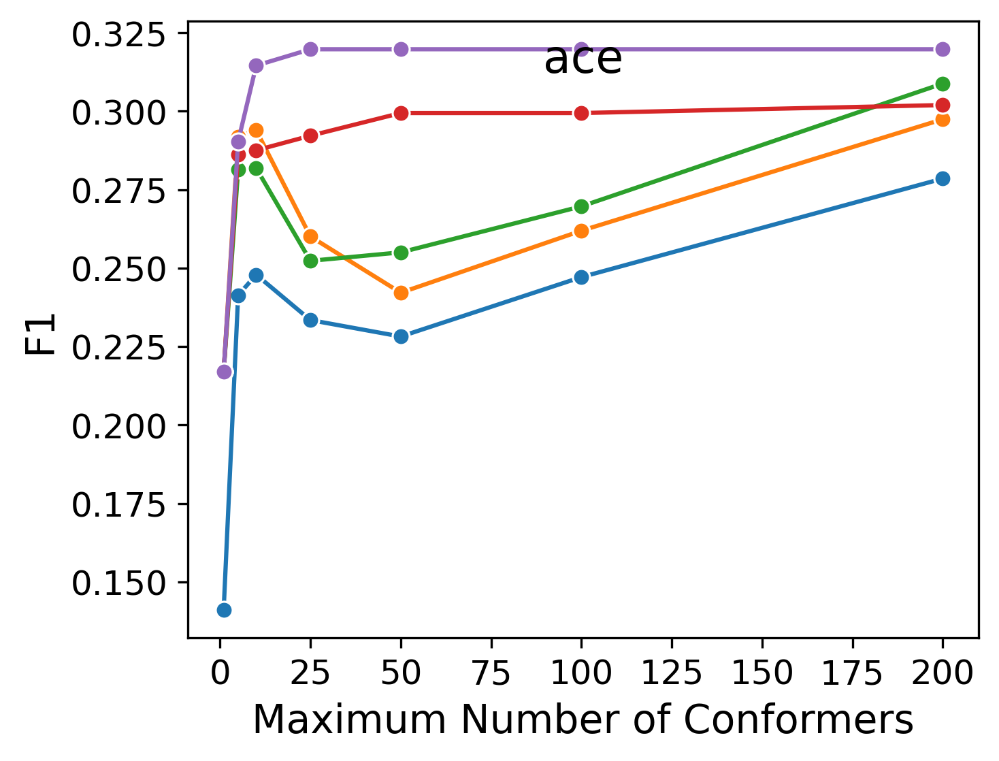

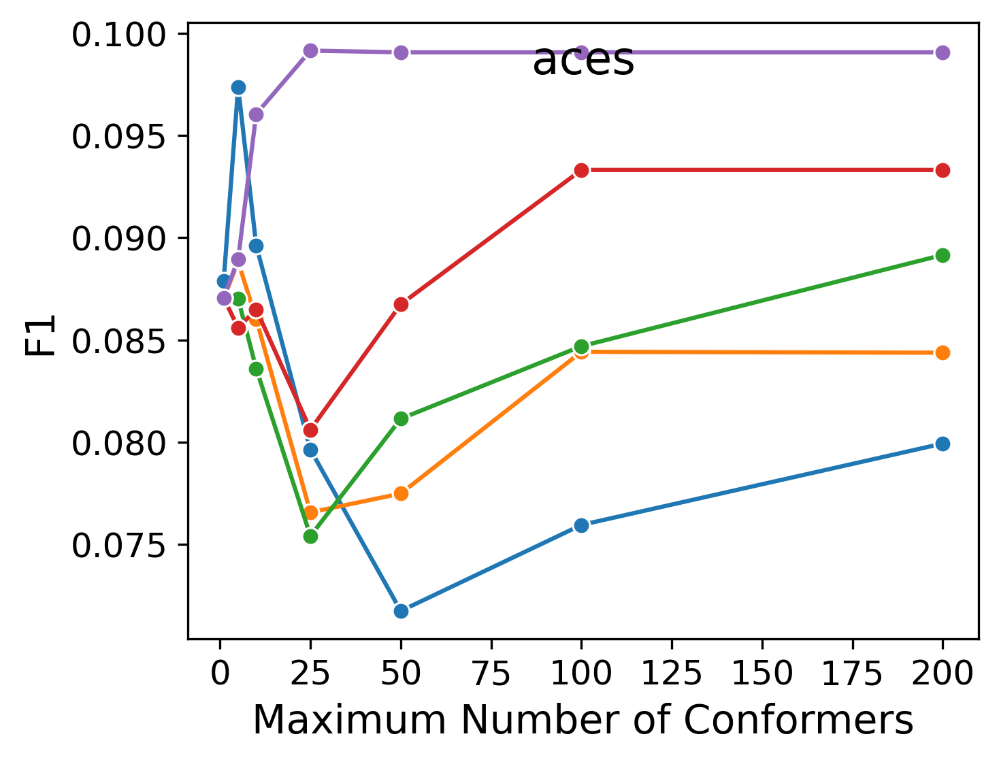

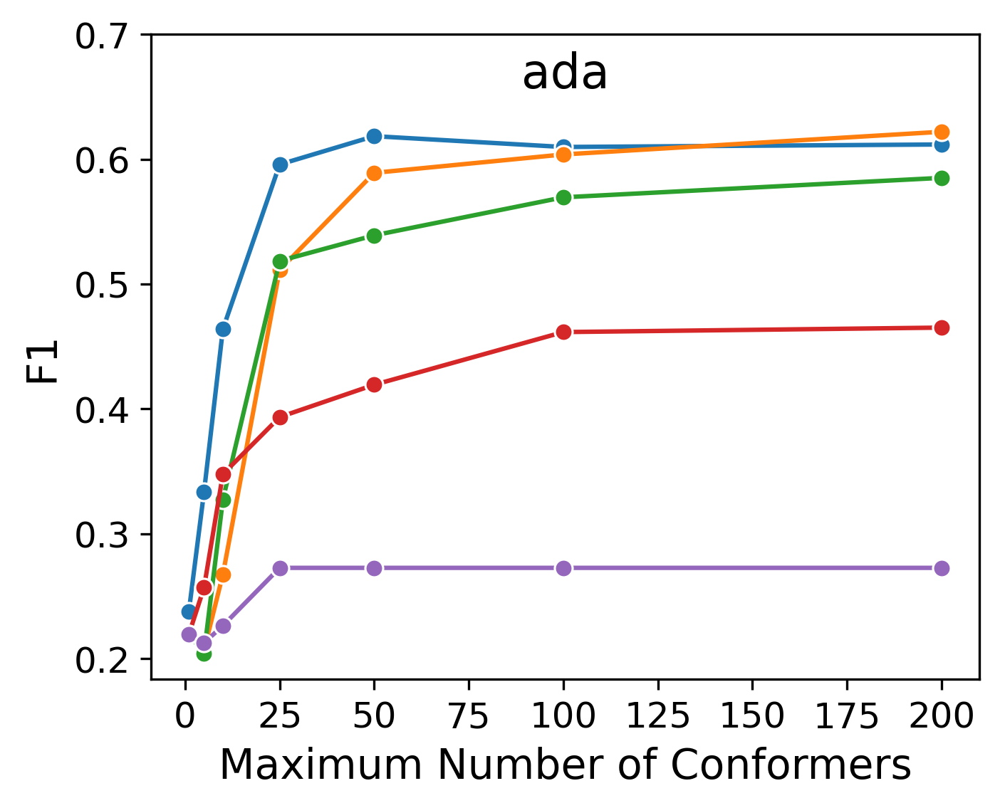

...

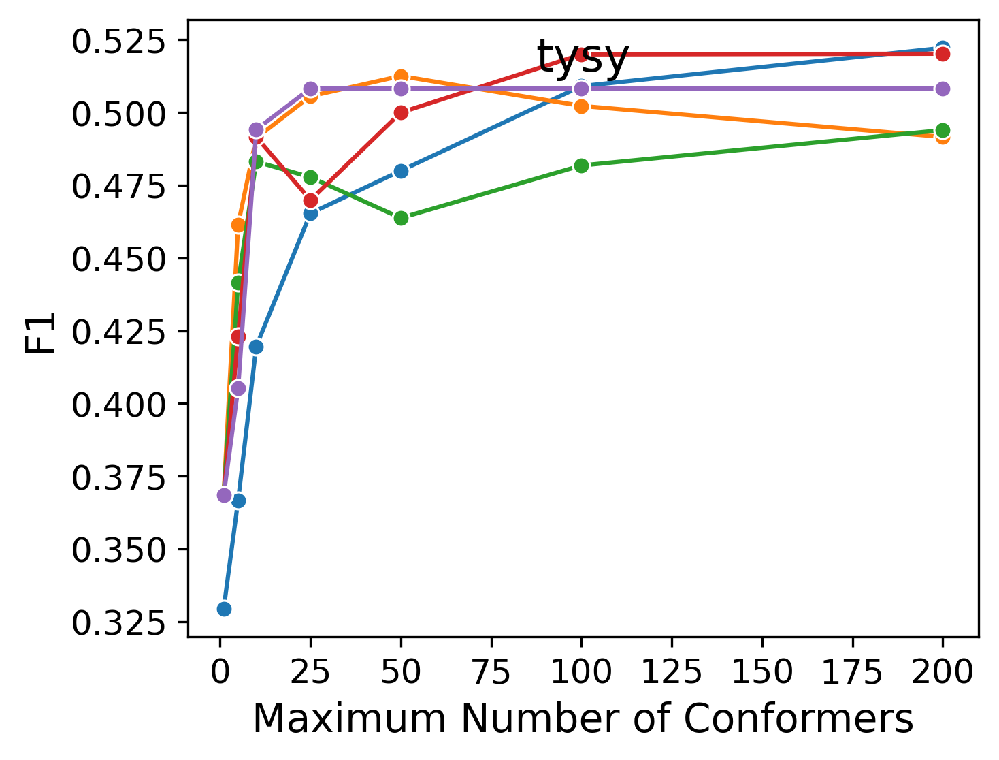

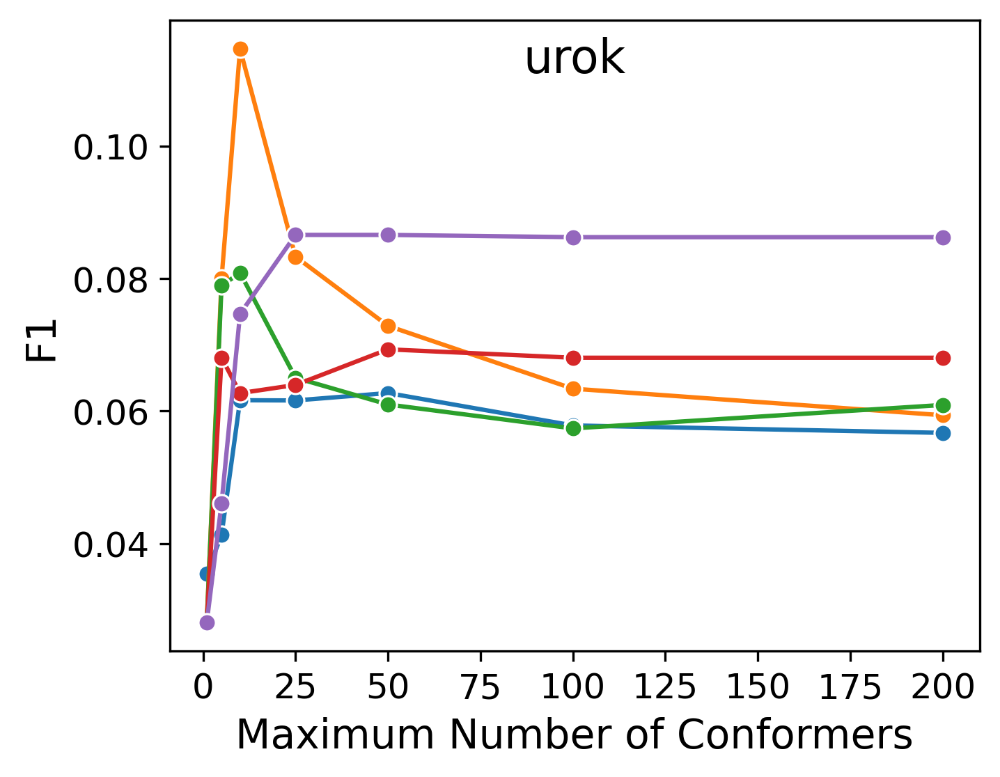

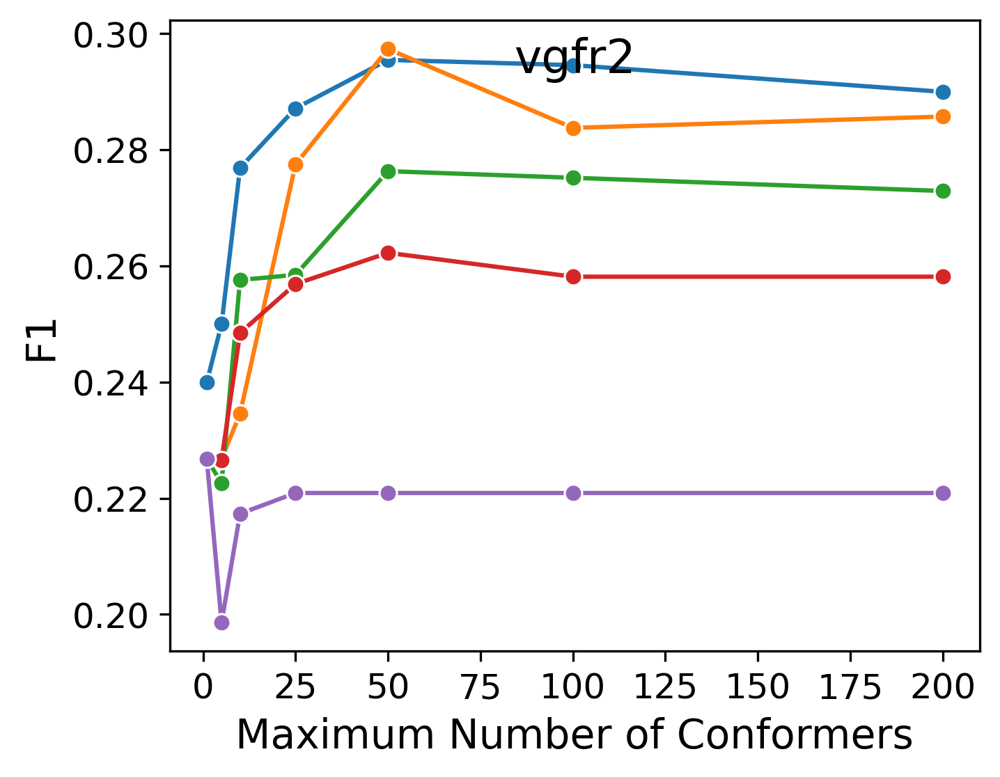

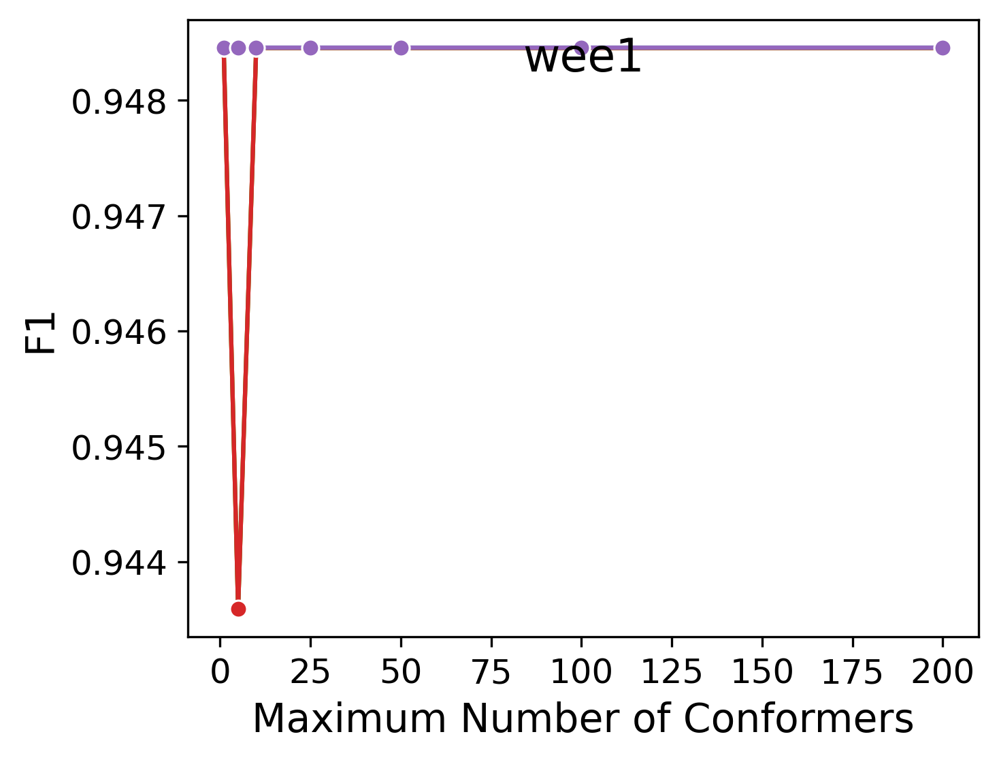

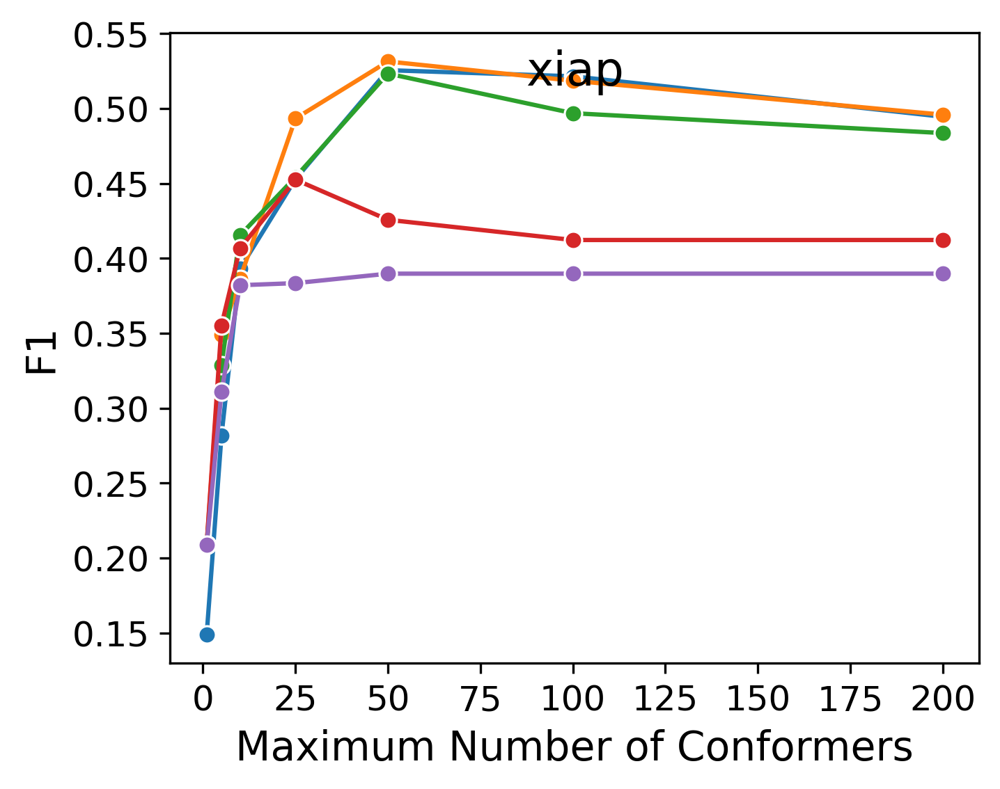

In [86]:
for targ in best.Target.unique():
    plt.figure(figsize=(5,4),dpi=300)
    sns.lineplot(best[best.Target == targ],x='nconfs',y='F1',hue='RMS',hue_order=['Unbiased',0.5,1.0,1.5,2.0],marker='o')
    plt.gca().get_legend().remove()
    plt.xlabel('Maximum Number of Conformers',fontsize=14)
    plt.ylabel('F1',fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
#    plt.ylim(0,1)
    if targ == 'ada':
        plt.ylim(None,0.7)
    plt.title(targ,fontsize=16,y=1.0, pad=-18)
    plt.savefig(f'F1_{targ}.pdf',bbox_inches='tight')
    

<Figure size 2400x3600 with 0 Axes>

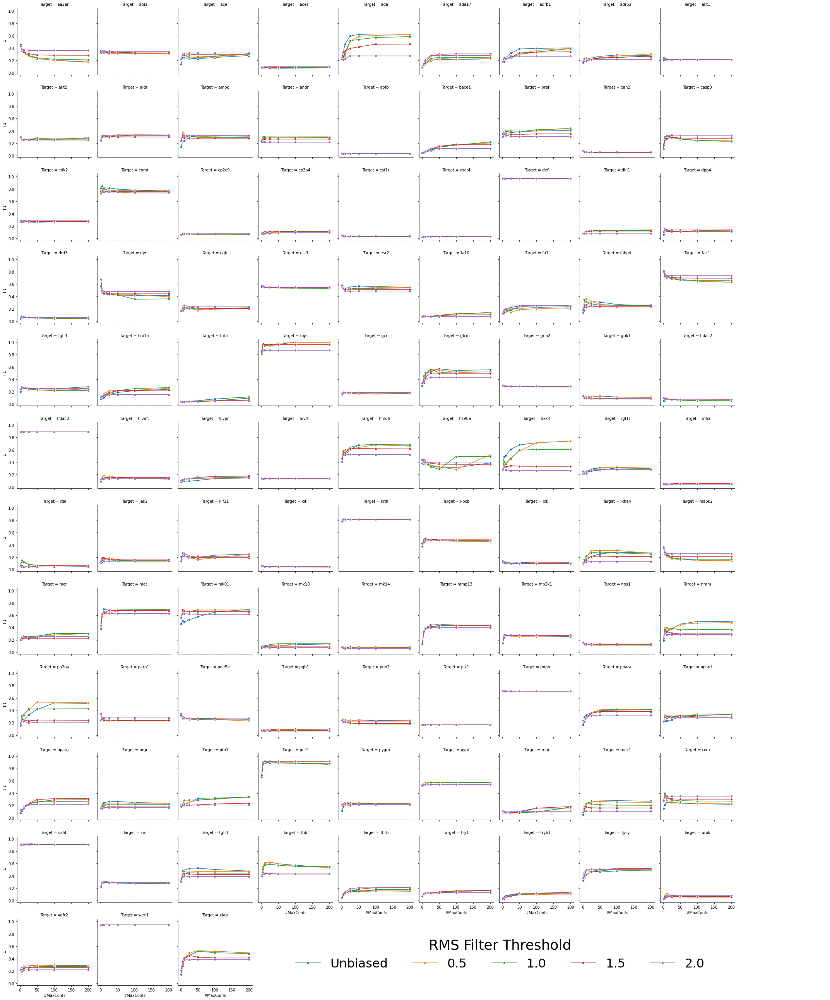

In [61]:
plt.figure(figsize=(6,9),dpi=400)
g = sns.FacetGrid(best, col="Target",col_wrap=9,hue='RMS',sharey=True,legend_out=True,
                  hue_order=['Unbiased',0.5,1.0,1.5,2.0])
g.map_dataframe(sns.lineplot, x='nconfs',y='F1',marker='o')
g.add_legend(loc=(0.35,0.025),ncol=5,fontsize=32,title_fontsize=48)
g.legend.set_title('RMS Filter Threshold')
g.legend.get_title().set_fontsize(36)
g.set_axis_labels("#MaxConfs","F1")

g.tight_layout()
plt.savefig('pharm_all.pdf',bbox_inches='tight')

<Figure size 2400x3600 with 0 Axes>

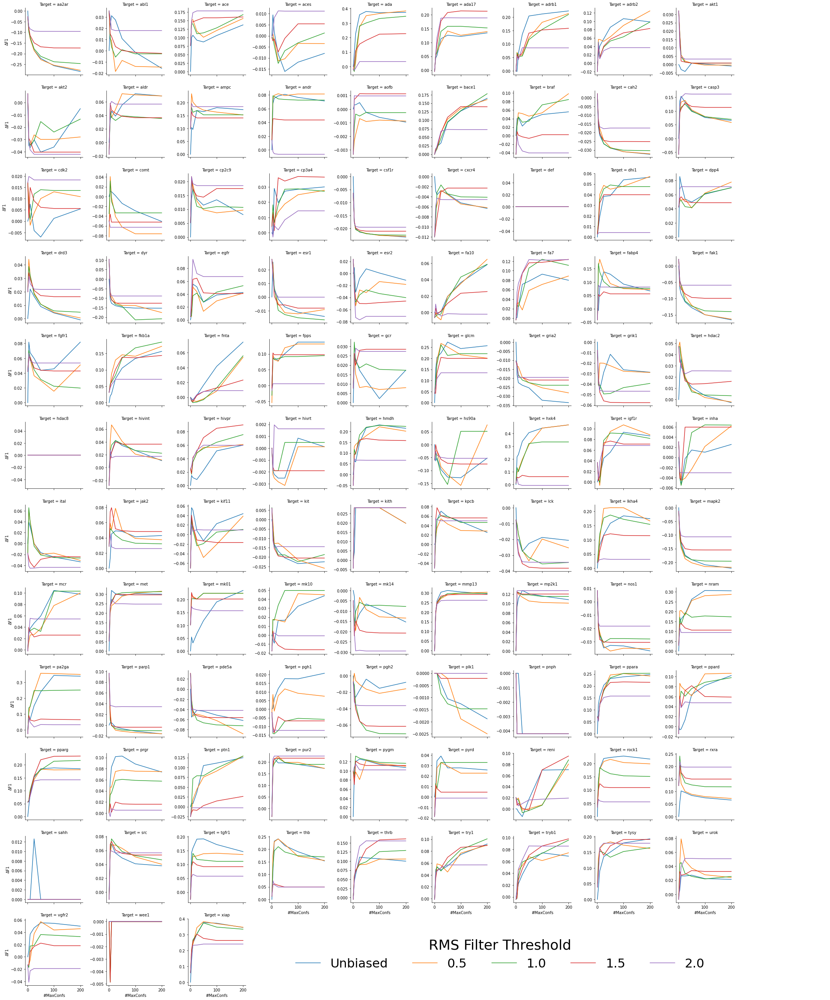

In [62]:
plt.figure(figsize=(6,9),dpi=400)
g = sns.FacetGrid(best, col="Target",col_wrap=9,hue='RMS',sharey=False,legend_out=True,hue_order=['Unbiased',0.5,1.0,1.5,2.0])
g.map_dataframe(sns.lineplot, x='nconfs',y='ΔF1')
g.add_legend(loc=(0.35,0.025),ncol=5,fontsize=32)
g.legend.set_title('RMS Filter Threshold')
g.legend.get_title().set_fontsize(36)
g.set_axis_labels("#MaxConfs","ΔF1")

g.tight_layout()
plt.savefig('pharm_all_rel.pdf',bbox_inches='tight')

In [18]:
idx = best.groupby(['Target'])['F1'].idxmax()
best.loc[idx]

,json,nconfs,F1,Recall,Precision,RMS,Target,aconfs,amols,dconfs,dmols,actualconfs,nmols,aveconfs,ΔF1
0,pharmit_3_2.json,1,0.456539,0.582988,0.375167,Unbiased,aa2ar,120500,482,7876697,31492,7997197,31974,250.115625,0.000000
42,pharmit_4_7.json,1,0.358804,0.296703,0.453782,0.5,abl1,22540,182,1232304,10745,1254844,10927,114.838840,0.035372
101,pharmit_3_174.json,25,0.319728,0.333333,0.307190,2,ace,4103,282,96592,16851,100695,17133,5.877254,0.178670
136,pharmit_5_20.json,25,0.099142,0.229581,0.063222,2,aces,6649,453,210852,26227,217501,26680,8.152211,0.011256
153,pharmit_4_1.json,200,0.621951,0.548387,0.718310,0.5,ada,13710,93,591341,5449,605051,5542,109.175568,0.384087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3401,pharmit_4_397.json,200,0.522222,0.431193,0.661972,Unbiased,tysy,27250,109,1685142,6731,1712392,6840,250.349708,0.192810
3439,pharmit_3_2.json,10,0.114695,0.098765,0.136752,0.5,urok,16662,162,1012417,9837,1029079,9999,102.918192,0.079227
3476,pharmit_4_33.json,50,0.297357,0.330073,0.270541,0.5,vgfr2,46987,409,2530368,22243,2577355,22652,113.780461,0.057423
3500,pharmit_4_398.json,1,0.948454,0.901961,1.000000,Unbiased,wee1,25500,102,1536731,6148,1562231,6250,249.956960,0.000000


In [19]:
best.loc[idx]['RMS'].value_counts()

Unbiased    38
0.5         31
1.0         15
1.5         10
2.0          8
Name: RMS, dtype: int64

<AxesSubplot:xlabel='RMS', ylabel='nconfs'>

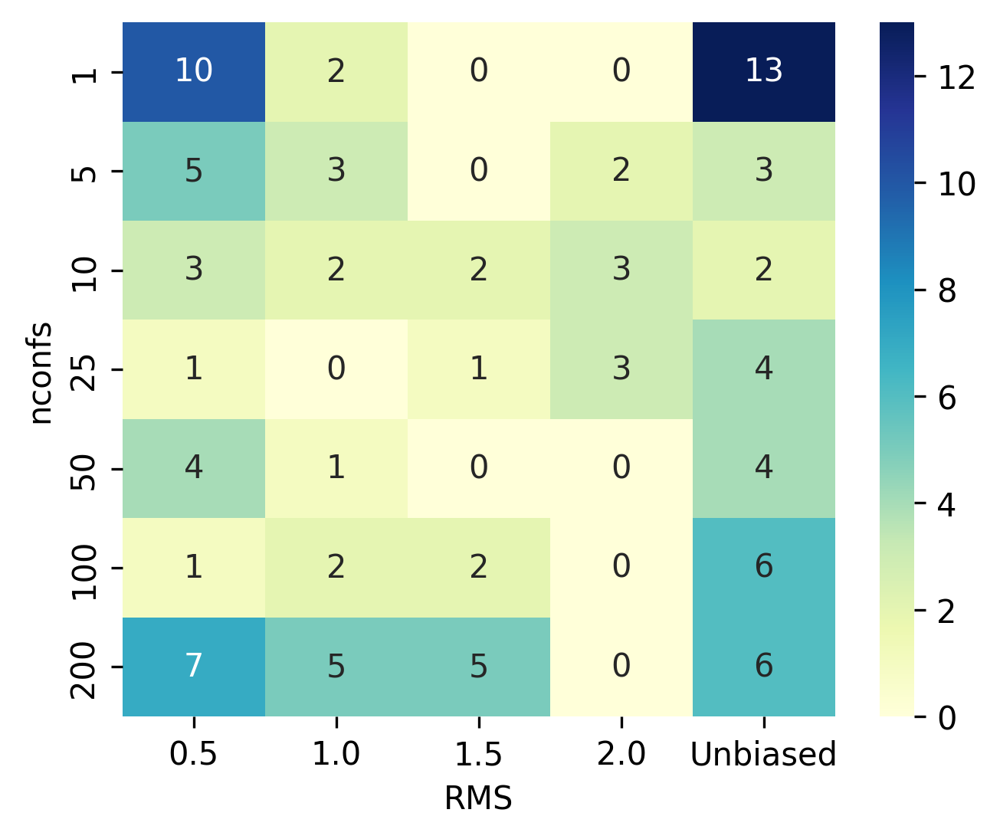

In [20]:
pivot = best.loc[idx].groupby(['nconfs','RMS']).size().unstack()
plt.figure(figsize=(5,4),dpi=300)
sns.heatmap(pivot, annot=True,cmap='YlGnBu')

<AxesSubplot:xlabel='RMS', ylabel='nconfs'>

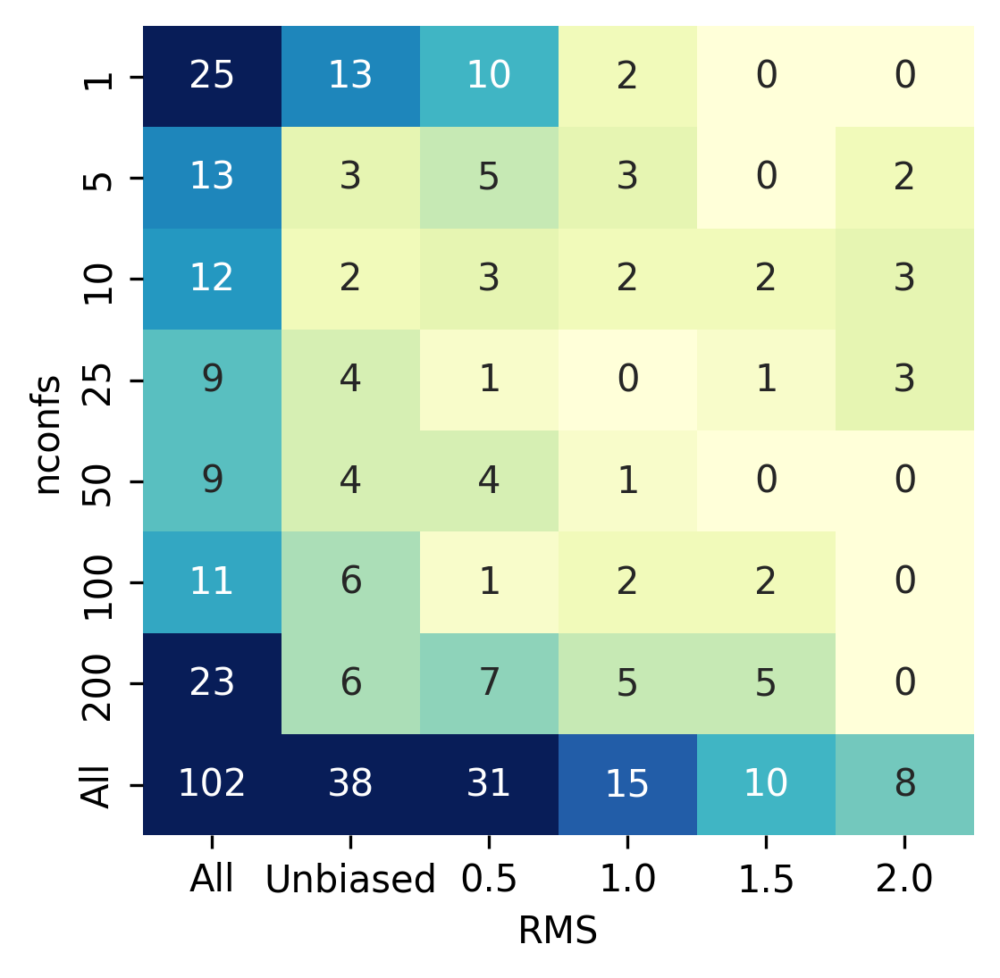

In [21]:
# Create a 2D histogram of the data
df = best.loc[idx]

# Create a cross-tabulation of the two categorical variables
cross_tab = pd.crosstab(df['nconfs'], df['RMS'],margins=True)
cross_tab = cross_tab[['All','Unbiased',0.5,1.0,1.5,2.0]]
# Create a figure and axes
fig = plt.figure(figsize=(4, 4),dpi=300)

# Draw the heatmap on the main axes
sns.heatmap(cross_tab,  cmap='YlGnBu', vmin=0,vmax=20,cbar=False, annot=True,fmt='.3g')


<AxesSubplot:xlabel='Count', ylabel='nconfs'>

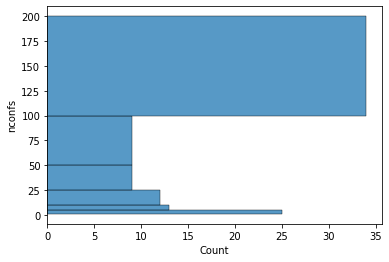

In [22]:
sns.histplot(df,y='nconfs',bins=sorted(df.nconfs.unique()))

In [110]:
idx = best[best.RMS == 0.5].groupby(['Target'])['F1'].idxmax()
best.iloc[idx].groupby('nconfs').count()['json']

nconfs
1      25
5      13
10      5
25     11
50     13
100     7
200    28
Name: json, dtype: int64

In [23]:
help(sns.histplot)

Help on function histplot in module seaborn.distributions:

histplot(data=None, *, x=None, y=None, hue=None, weights=None, stat='count', bins='auto', binwidth=None, binrange=None, discrete=None, cumulative=False, common_bins=True, common_norm=True, multiple='layer', element='bars', fill=True, shrink=1, kde=False, kde_kws=None, line_kws=None, thresh=0, pthresh=None, pmax=None, cbar=False, cbar_ax=None, cbar_kws=None, palette=None, hue_order=None, hue_norm=None, color=None, log_scale=None, legend=True, ax=None, **kwargs)
    Plot univariate or bivariate histograms to show distributions of datasets.
    
    A histogram is a classic visualization tool that represents the distribution
    of one or more variables by counting the number of observations that fall within
    discrete bins.
    
    This function can normalize the statistic computed within each bin to estimate
    frequency, density or probability mass, and it can add a smooth curve obtained
    using a kernel density estimate

[Unbiased, 0.5, 1, 1.5, 2]
Categories (5, object): [Unbiased, 0.5, 1, 1.5, 2]

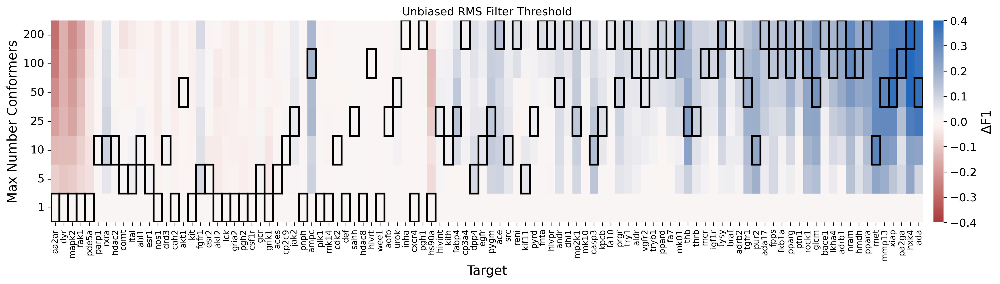

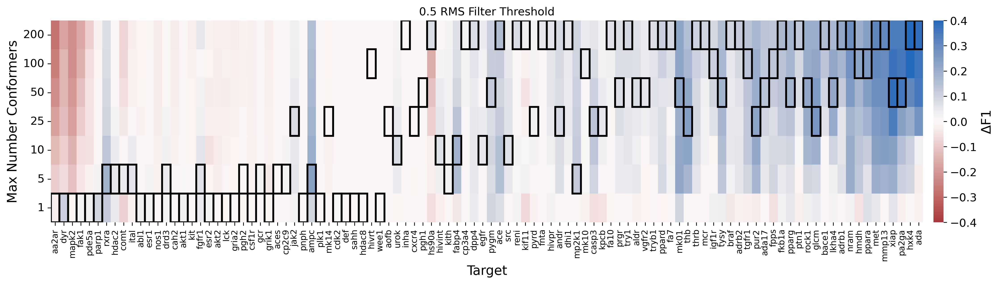

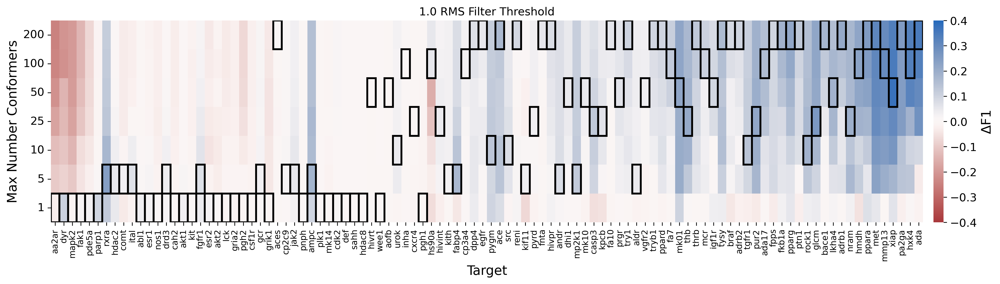

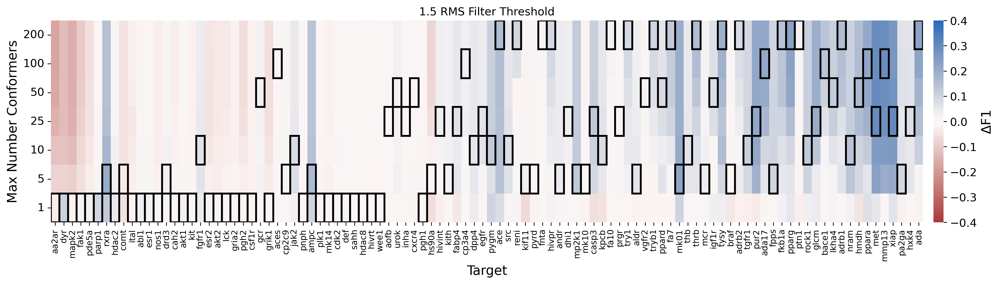

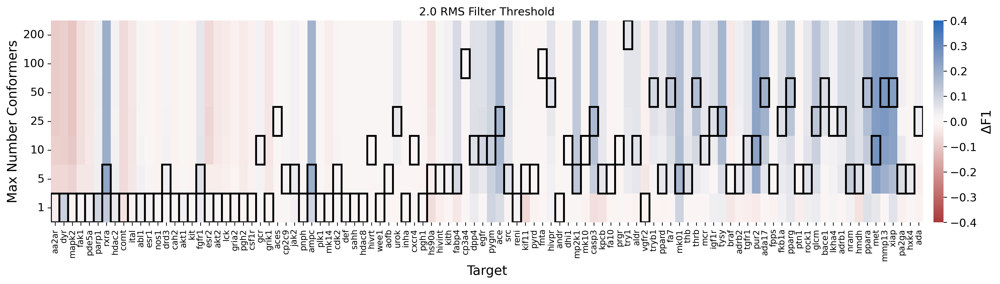

In [99]:
mat = best[best.RMS==0.5][['nconfs','Target','ΔF1']].pivot(index='Target',columns='nconfs')
mat = mat.droplevel(level=0,axis=1)
indices = np.argsort([np.polyfit(range(len(mat.columns)), row, 1)[0] for r,row in mat.iterrows()])
    
    
for rms in best.RMS.unique():
    mat = best[best.RMS==rms][['nconfs','Target','ΔF1']].pivot(index='Target',columns='nconfs')
    mat = mat.droplevel(level=0,axis=1)
#    indices = leaves_list(linkage(np.array(mat),method='complete',metric='cityblock'))
#    indices[50:] = indices[-1:49:-1] # hack to get clustering to look better
    #indices = np.argsort(mat[200]-mat[1])
    #indices = np.argsort([np.polyfit(range(len(mat.columns)), row, 1)[0] for r,row in mat.iterrows()])
    plt.figure(figsize=(20,4),dpi=300)
    ax = sns.heatmap(mat.transpose().iloc[::-1,indices],xticklabels=1,cmap='vlag_r',vmin=-.4,vmax=0.4,cbar_kws={'pad':0.01})
    ax.set_xticklabels(ax.get_xticklabels(), size=9);
    ax.set_ylabel('Max Number Conformers',fontsize=14)
    ax.set_xlabel('Target',fontsize=14)
    cbar = ax.collections[0].colorbar
    cbar.set_label('ΔF1', fontsize=14)
    cbar.ax.tick_params(labelsize=12)

    ax.tick_params(axis='y',labelsize=12,labelrotation=0)

    C = len(mat.columns)-1
    for pos,i in enumerate(indices):
        c = np.argmax(mat.iloc[i])
        ax.add_patch(plt.Rectangle((pos, C-c), 1, 1, fill=False, edgecolor='black', lw=2));

    plt.title(f'{rms} RMS Filter Threshold')
    plt.savefig(f'pharm_heatmap_{rms}.pdf',bbox_inches='tight')